# Самостоятельный проект

Цель проекта: Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


План работы: 
-Изучить данные, сделать предобработку.
-Анализ данных.
-Детализированное исследование - открытие кофейни.
-Подготовка презентации.

Имеющиеся данные:
/.../....csv - датасет с заведениями общественного питания Москвы.

**Шаг 1. Загрузим данные и изучим общую информацию**

In [55]:
#Загрузим необходимые библитотеки
import pandas as pd
import datetime as dt
import plotly.express as px 
import seaborn as sns
import folium
# импортируем карту и хороплет
from folium import Map, Choropleth
# импортируем кластер
from folium.plugins import MarkerCluster
from folium import Marker, Map
import scipy.stats as st
import numpy as np
from plotly import graph_objects as go
import math as mth
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()

In [56]:
data = pd.read_csv('/.../....csv', sep = ',')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [58]:
data.groupby('name').agg({'name':'unique'}).count()

name    5614
dtype: int64

Всего в файле содержится информация о 5613 заведениях.

In [59]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных в файле корректны - нет необходимости менять для какого-либо столбца.

**Шаг 2. Выполним предобработку данных**

In [60]:
#Определим кол-во пропущенных значений
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Видим, что в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats есть пропущенный значения.
Т.к. нет возможности корректно заполнить пропуски, то оставим их без изменения.

In [61]:
#Сделаем проверку на явные дубликаты
data.duplicated().sum()

0

Явные дубликаты отсутствуют.

Сделаем проверку на неявные дубликаты.

In [62]:
#Содадим дополнительные столбцы для name и address и преведем данные в них в нижний регистр
data['name_lower'] = data['name'].str.lower()
data['address_lower'] = data['address'].str.lower()

In [63]:
#Найдем дубликаты по полям name_lower и address_lower
data.duplicated(subset=['name_lower', 'address_lower']).sum()

4

In [64]:
#Удалим найденные дубликаты
data = data.drop_duplicates(subset=['name_lower', 'address_lower'], keep='first')

In [65]:
#Убедимся, что дубликаты удалены
data.duplicated(subset=['name_lower', 'address_lower']).sum()

0

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [66]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

Создадим столбец street с названиями улиц из столбца с адресом.

In [67]:
#Создадим отдельный столбец с названием улицы
data['street']=[x.split(', ')[1] for x in data['address'].values]

**Шаг 3. Проведем анализ данных**

3.1 Определим, какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.

In [68]:
data_cat = data.pivot_table(index='category', values='name', aggfunc = 'count').reset_index()
data_cat.columns = ['category', 'qty']
data_cat1=data_cat.sort_values(by='qty', ascending=False)
data_cat1

,category,qty
3,кафе,2376
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


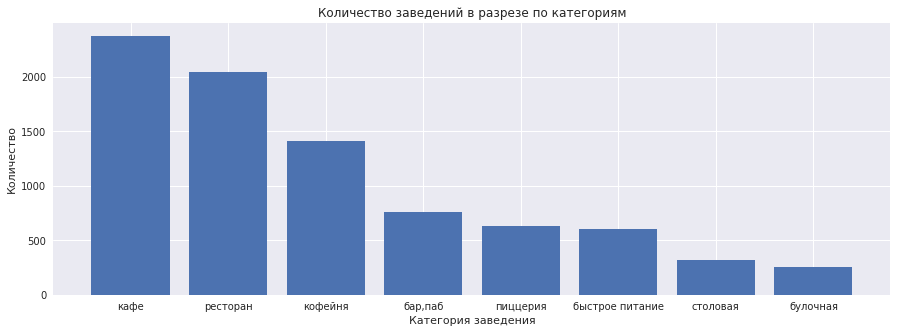

In [69]:
plt.figure(figsize=(15, 5))
with plt.style.context('seaborn'):
    plt.bar(data_cat1['category'],data_cat1['qty'])
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.title('Количество заведений в разрезе по категориям')
plt.show()

На графике видно, что Топ - 3 заведений - кафе, ресторан, кофейня.

3.2 Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
    Построим визуализации.

In [70]:
data_seats = data.pivot_table(index='category', values='seats', aggfunc = 'median').reset_index()
data_seats.columns = ['category', 'seats']
data_seats1=data_seats.sort_values(by='seats', ascending=False)
data_seats1

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


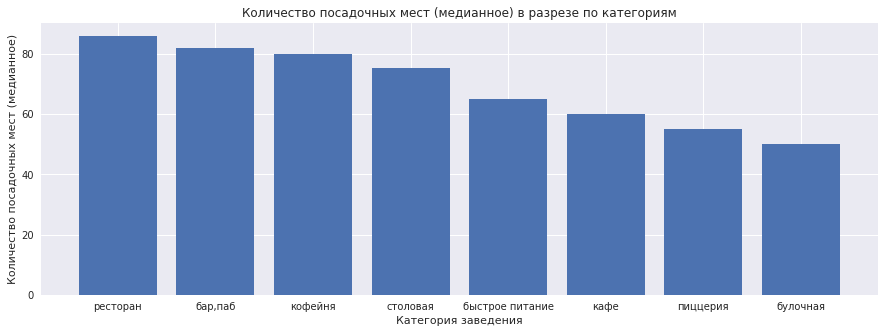

In [16]:
plt.figure(figsize=(15, 5))
with plt.style.context('seaborn'):
    plt.bar(data_seats1['category'],data_seats1['seats'])
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест (медианное)')
plt.title('Количество посадочных мест (медианное) в разрезе по категориям')
plt.show()

Из таблицы и графика видно, что лидеры по кол-ву посадочных мест ресторан, бар, кофейня. 

3.3 Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Выясним, каких заведений больше.

In [71]:
data_chain = data.pivot_table(index='chain', values='name', aggfunc = 'count').reset_index()
data_chain.columns = ['chain', 'qty']
data_chain

,chain,qty
0,0,5199
1,1,3203


In [72]:
fig = go.Figure(data=[go.Pie(labels=data_chain['chain'], values=data_chain['qty'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                  width=500, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.12,
                                    y=1.12,
                                    text='1 - сетевое/0 - не сетевое заведение',
                                    showarrow=False)])
fig.show() 

Видим, что сетевых заведений почти в 2 раза меньше.

3.4 Выясним, какие категории заведений чаще являются сетевыми. Исследуем данные и ответим на вопрос графиком.

Видим, что соотношение Топ - 3 не изменилось для категории сетевых заведений - это кафе, ресторан, кофейня.

In [73]:
#Рассчитаем долю сетевых заведений от общего кол-ва заведений в разбивке по категориям
chain_share = data.pivot_table(index=['category'], values='chain', aggfunc=['count','sum']).reset_index()
chain_share.columns = ['category', 'all_qty', 'chain_qty']
chain_share['share'] = round((chain_share['chain_qty'] / chain_share['all_qty'])*100,1)
chain_share1 = chain_share.sort_values(by='share', ascending=False)
chain_share1

,category,all_qty,chain_qty,share
1,булочная,256,157,61.3
5,пиццерия,633,330,52.1
4,кофейня,1413,720,51.0
2,быстрое питание,603,232,38.5
6,ресторан,2042,729,35.7
3,кафе,2376,779,32.8
7,столовая,315,88,27.9
0,"бар,паб",764,168,22.0


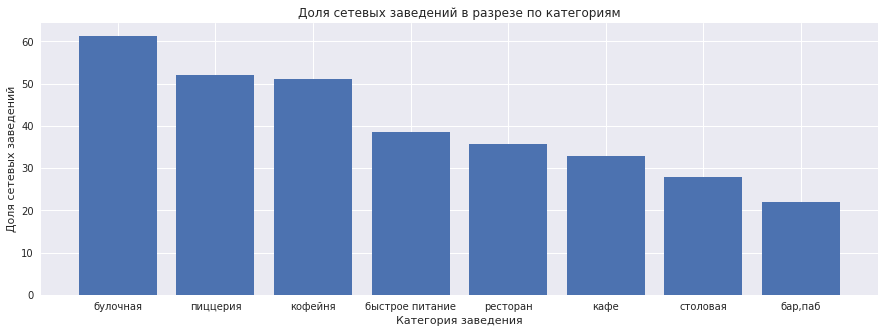

In [74]:
plt.figure(figsize=(15, 5))
with plt.style.context('seaborn'):
    plt.bar(chain_share1['category'],chain_share1['share'])
plt.xlabel('Категория заведения')
plt.ylabel('Доля сетевых заведений')
plt.title('Доля сетевых заведений в разрезе по категориям')
plt.show()

На графике видно, что Топ - 3 лидеров по доле сетевых заведений это булочные, пиццерия, кофейня.

In [75]:
data_cat_ch = data.query('chain != 0').pivot_table(index='category', values='name', aggfunc = 'count').reset_index()
data_cat_ch.columns = ['category', 'qty']
data_cat_ch1 = data_cat_ch.sort_values(by='qty', ascending=False)
data_cat_ch1

,category,qty
3,кафе,779
6,ресторан,729
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",168
1,булочная,157
7,столовая,88


3.5 Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию.

In [76]:
data_1 = data.query('chain != 0').pivot_table(index='name', values='chain', aggfunc = 'sum').reset_index()
data_1.columns = ['name', 'qty']
data_2 = data_1.sort_values(by='qty', ascending=False)
top_15 = data_2.head(15)
top_15

,name,qty
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


In [77]:
fig = px.bar(top_15, x='qty', y='name', title='Топ-15 популярных сетей в Москве')
fig.update_layout(xaxis_title = 'Количество заведений', yaxis_title = 'Название сети')
fig.show()

Топ-3 самых популярных сетей в Москве - "Шоколадница", "Доминос пицца", "Додо пицца".

In [78]:
#Определим к каким категориям относятся эти заведения
data_1 = data.query('chain != 0').pivot_table(index=['category','name'], values='chain', aggfunc = 'sum').reset_index()
data_1.columns = ['category', 'name', 'qty']
data_2 = data_1.sort_values(by='qty', ascending=False)
top_15 = data_2.head(15)
top_15_cat = top_15.pivot_table(index=['category'], values='qty', aggfunc = 'sum').sort_values(by='qty', ascending=False)
top_15_cat

,qty
category,
кофейня,350
ресторан,154
пиццерия,150
кафе,89
булочная,25


Видно, что большенство заведений относится к категории "кофейня".

3.6 Определим, какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию одним графиком.

In [79]:
data_dis = data.pivot_table(index=['district', 'category'], values='name', aggfunc = 'count').reset_index()
data_dis.columns = ['district','category','qty']
data_dis1 = data_dis.sort_values(by='qty', ascending=False)
data_dis1

,district,category,qty
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [80]:
fig = px.bar(data_dis1, x='qty', y='district',color='category',title='Распределение заведений Москвы по округам и категориям')
fig.update_layout(xaxis_title = 'Количество заведений', yaxis_title = 'Округ')
fig.show()

Видим, что лидирует по количеству заведений Центральный административный округ. Большая часть заведений это рестораны, кафе и кофейни.

3.7 Визуализируем распределение средних рейтингов по категориям заведений. Выясним, сильно ли различаются усреднённые рейтинги в разных типах общепита.

In [81]:
data_rating = data.pivot_table(index='category', values='rating', aggfunc = 'mean').reset_index()
data_rating.columns = ['category', 'avg_rating']
data_rating_1 = data_rating.sort_values(by='avg_rating', ascending=False)
data_rating_gr = round(data_rating_1,2)
data_rating_gr

,category,avg_rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [82]:
fig = px.bar(data_rating_gr, x='avg_rating', y='category', title='Средний рейтинг заведений Москвы в разрезе категорий')
fig.update_layout(xaxis_title = 'Средний рейтинг', yaxis_title = 'Категория')
fig.show()

Из таблицы и графика видно, что сильных различий в среднем рейтинге нет - колеблется от 4.39 до 4.05.

3.8 Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [83]:
# Расчитаем средний рейтинг заведений по округам
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
round(rating_data,2)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [84]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Заведения Центрального округа имеют самый высокий средний рейтинг, а Юго-Восточного самый низкий.

3.9 Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [86]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

3.10 Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [88]:
#Создадим датафрейм с топ15 улиц по кол-ву заведений
data_street = data.pivot_table(index=['street'], values='name', aggfunc = 'count').reset_index()
data_street.columns = ['street', 'street_qty']
data_street_1 = data_street.sort_values(by='street_qty', ascending=False)
data_fin_street = data_street_1.head(15)
data_fin_street

,street,street_qty
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [89]:
#Создадим датафрем с названием категории
data_street_cat = data.pivot_table(index=['street','category'], values='name', aggfunc = 'count').reset_index()
data_street_cat.columns = ['street', 'category', 'street_qty']
data_street_cat.head()

,street,category,street_qty
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1


In [90]:
#Обьединим таблицы, чтобы получить данные только для топ 15 улиц
data_str_final = data_street_cat.merge(data_fin_street, on='street')
data_str_final_1 = data_str_final.sort_values(by=['street_qty_y','street_qty_x'], ascending=False)
data_str_final_1

,street,category,street_qty_x,street_qty_y
93,проспект Мира,кафе,53,183
96,проспект Мира,ресторан,45,183
94,проспект Мира,кофейня,36,183
92,проспект Мира,быстрое питание,21,183
90,проспект Мира,"бар,паб",11,183
...,...,...,...,...
78,Пятницкая улица,кафе,7,48
79,Пятницкая улица,кофейня,6,48
76,Пятницкая улица,булочная,3,48
80,Пятницкая улица,пиццерия,3,48


Видно, что лидер по количеству заведений это Проспект Мира, большую часть которых стоставляют кафе.

3.11 Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [92]:
#Создадим датафрейм с названиями улиц, на которых находится только 1 заведение
data_street = data.pivot_table(index='street', values='category', aggfunc = 'count').reset_index()
data_street.columns = ['street', 'street_qty']
data_street_1 = data_street.query('street_qty <= 1')
data_street_1

,street,street_qty
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


Получили список из 459 заведений и улиц.

In [93]:
#Обьединим таблицы, чтобы получить данные только для нужных улиц
data_one = data_street_1.merge(data, on='street')

Построим карту, чтобы более детально рассмотреть особенности расположения заведений.

In [94]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_one.apply(create_clusters, axis=1)

# выводим карту
m

При изучении карты видно, что эти заведения находятся либо в спальных районах, либо в промозонах - далеко от метро и популярных улиц.

In [95]:
#Проверим, сколько в этом списке сетевых заведений
data_one_upd_fin = data_one.query('street_qty <= 1 and (chain != 0)').pivot_table(index='street', values='category', aggfunc = 'count')
data_one_upd_fin

,category
street,
1-й Автозаводский проезд,1
1-й Капотнинский проезд,1
1-й Рижский переулок,1
1-й Самотёчный переулок,1
1-я Курьяновская улица,1
...,...
улица Розанова,1
улица Советской Армии,1
улица Станиславского,1


Получили список из 133 заведений, что составляет 29% от общего числа.
Таким образом, можно сделать вывод, что это заведения, которые находятся в спальных районах или промзонах далеко от метро и большинство из них является не сетевыми.

3.12 Посчитаем медиану столбца middle_avg_bill для каждого района. Используем это значение в качестве ценового индикатора района. 
Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.
Проанализируем цены в центральном административном округе и других. Выясним, как удалённость от центра влияет на цены в заведениях.

In [96]:
data_med_bill = data.pivot_table(index='district', values='middle_avg_bill', aggfunc = 'median').reset_index()
data_med_bill.columns = ['district', 'meadian_bill']
data_med_bill_1 = data_med_bill.sort_values(by='meadian_bill', ascending=False)
data_med_bill_1

,district,meadian_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [97]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_med_bill,
    columns=['district', 'meadian_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по округам Москвы',
).add_to(m)

# выводим карту
m

В Центральном и Западном округах наивысший средний чек в заведениях. Скорее всего это связано не с удаленностью от центра, а в большей степени от развитости и престижности района, стоимости недвижимости в нем, уровня платежеспособности населения.

Из проведенного выше исследования можно сделать следующие выводы:
- Были определены категории заведений Москвы. Топ - 3 категории заведений по количеству: кафе, ресторан, кофейня.
- Выяснили, какое медианное количество посадочных мест в зависимости от категории заведения. Топ - 3 категории заведений по количеству посадочных мест: ресторан, бар/паб, кофейня.
- Определили соотношение сетевых/ не сетевых заведений. Выяснилось, что сетевых заведений почти в 2 раза больше, чем не сетевых (61.9% к 31.8%).
- Рассмотрели только сетевые заведения - распределение по количеству в зависимости от категории осталось таким же, как и для всех заведений - лидеры это кафе, ресторан, кофейня.
- Определили Топ - 15 популярных сетевых заведений в Москве. Лидеры списка - Шоколадница, Доминос пицца, Додо пицца.
Большенство заведений относится к категории "кофейня".
- Определили, какие административные районы Москвы присутствуют в датасете. Видим, что лидирует по количеству заведений Центральный административный округ. Большая часть заведений это рестораны, кафе и кофейни.
- Визуализировали распределение средних рейтингов по категориям заведений. Выяснили, что сильных различий в среднем рейтинге нет - он колеблется от 4.39 до 4.05.
- Построили фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Заведения Центрального округа имеют самый высокий средний рейтинг, а Юго-Восточного самый низкий.
- Нашли Топ-15 улиц по количеству заведений. Лидеры - Проспект Мира, Профсоюзная улица, Проспект Вернадского.
Построили график распределения количества заведений и их категорий по этим улицам - лидируют категории кафе, ресторан, кофейня.
- Нашли улицы, на которых находится только один объект общепита, построили карту их распределения. При изучении карты видно, что эти заведения находятся либо в спальных районах, либо в промозонах - далеко от метро и популярных улиц.
Проверили, сколько в этом списке сетевых заведений. Получили список из 133 заведений, что составляет 29% от общего числа. Таким образом, можно сделать вывод, что это заведения, которые находятся в спальных районах или промзонах далеко от метро и большинство из них является не сетевыми.
- Рассчитали медиану столбца middle_avg_bill для каждого района. Использовали это значение в качестве ценового индикатора района. Построили фоновую картограмму (хороплет) с полученными значениями для каждого района. Видно, что В Центральном и Западном округах наивысший средний чек в заведениях. Скорее всего это связано не с удаленностью от центра, а в большей степени от развитости и престижности района, стоимости недвижимости в нем, уровня платежеспособности населения.

**Шаг 4. Детализируем исследование: открытие кофейни**

Определим, сколько всего кофеен в датасете. В каких районах их больше всего, каковы особенности их расположения.

In [98]:
#Определим сколько всего кофеен в датасете
data_cof = data.query('category in "кофейня"') 
data_cafe = data_cof.pivot_table(index='category', values='name', aggfunc = 'count').reset_index()
data_cafe.columns = ['category', 'qty']
data_cafe

,category,qty
0,кофейня,1413


In [99]:
#Определим, в каком районе кофеен больше всего
data_dis_с = data_cof.pivot_table(index=['district', 'category'], values='name', aggfunc = 'count').reset_index()
data_dis_с.columns = ['district','category','qty']
data_dis_с1 = data_dis_с.sort_values(by='qty', ascending=False)
data_dis_с1

,district,category,qty
5,Центральный административный округ,кофейня,428
2,Северный административный округ,кофейня,193
3,Северо-Восточный административный округ,кофейня,159
1,Западный административный округ,кофейня,150
8,Южный административный округ,кофейня,131
0,Восточный административный округ,кофейня,105
7,Юго-Западный административный округ,кофейня,96
6,Юго-Восточный административный округ,кофейня,89
4,Северо-Западный административный округ,кофейня,62


Отобразим кофейни на карте с помощью кластеров.

In [100]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cof.apply(create_clusters, axis=1)

# выводим карту
m

Кофейни чаще всего располагаются на оживленных улицах - рядом с метро или офисными центрами. Также много кофеен/кофейных уголков в торговых центрах.

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Также, дополнительно можно показать на барплот.
</div>

Выясним, есть ли круглосуточные кофейни.

In [101]:
#Определим сколько всего круглосуточных кофеен в датасете
data_cafe24 = data_cof.query('is_24_7 == True').pivot_table(index='category', values='name', aggfunc = 'count').reset_index()
data_cafe24.columns = ['category', 'qty']
data_cafe24

,category,qty
0,кофейня,59


Выясним, какие у кофеен рейтинги. Как они распределяются по районам.

In [102]:
# Расчитаем средний рейтинг заведений по округам
rating_cafe = data_cof.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
round(rating_cafe,2)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента</b> 
    
Добавила сортировку.  </div>

<div class="alert alert-danger" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
✍ 
Сортировка :(
</div>

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.2</b> 
    
👍 

</div>

In [103]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

У кофеен в среднем высокий рейтинг по сравнению с другими категориями заведений. Лидерами в рейтинге являются Центральный и Северо-Западный округа.

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Верная интерпретация полученных данных.
</div>

Определим, на какую стоимость чашки каппучино стоит ориентироваться при открытии.

Выведем возможные варианты цены, чтобы оценить есть ли выбросы.

In [104]:
data_cof['middle_coffee_cup'].unique()

array([ 170.,   nan,  145.,  150.,  180.,  120.,  100.,  256.,  160.,
        250.,  165.,  149.,  135.,  220.,  175.,  195.,   60.,  214.,
         89.,   95.,  204.,   90.,  140.,  125.,  162.,  155.,  154.,
        297.,  205.,  124.,  200.,  190.,  134.,  139.,  287.,  225.,
        230.,  237.,  290.,  254.,  279.,  174.,  179.,  295.,  245.,
        105.,  285.,  270.,   84.,  127.,   80.,  185.,  210.,  325.,
        159.,  215.,  110.,  266.,  242.,  137.,  255.,  240.,  217.,
        315.,  130.,  167.,  169.,  235., 1568.,   79.,  260.,  300.,
        291.,  275.,  115.,  328.,   94.,  265.,  184.,  229.,  164.,
        172.,  259.,  246.,  199.,  138.,  375.,  189.,  320.,  197.,
        227.,  102.,  119.,   75.,  144.,  129.])

Видим, что есть выброс со стоимостью 1568 руб - скорее всего это опечатка. 
Поэтому для более корректного анализа, возьмем ограничение в цене - 350 руб. То, что выше - либо опечатки, либо цена в премиальных заведениях,
которые не относятся к нашему исследованию.

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Молодец! Верное наблюдение!
</div>

In [105]:
#Создадим новый датасет с учетом обьявленного ограничения
cof_final = data_cof.query('middle_coffee_cup < 350')

In [106]:
#Рассчитаем среднее значение по городу
round(cof_final['middle_coffee_cup'].mean(),1)

172.0

In [107]:
#Рассчитаем среднее значение по округам
avg_cof = cof_final.pivot_table(index='district', values='middle_coffee_cup', aggfunc = 'mean').reset_index()
avg_cof.columns = ['district', 'mean_cup']
avg_cof_fin = avg_cof.sort_values(by='mean_cup', ascending=False)
avg_cof_fin

,district,mean_cup
1,Западный административный округ,189.938776
5,Центральный административный округ,187.518519
7,Юго-Западный административный округ,184.176471
2,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
3,Северо-Восточный административный округ,165.333333
8,Южный административный округ,158.488372
6,Юго-Восточный административный округ,144.303030
0,Восточный административный округ,140.024390


Построим распределение стоимости чашки кофе по районам.

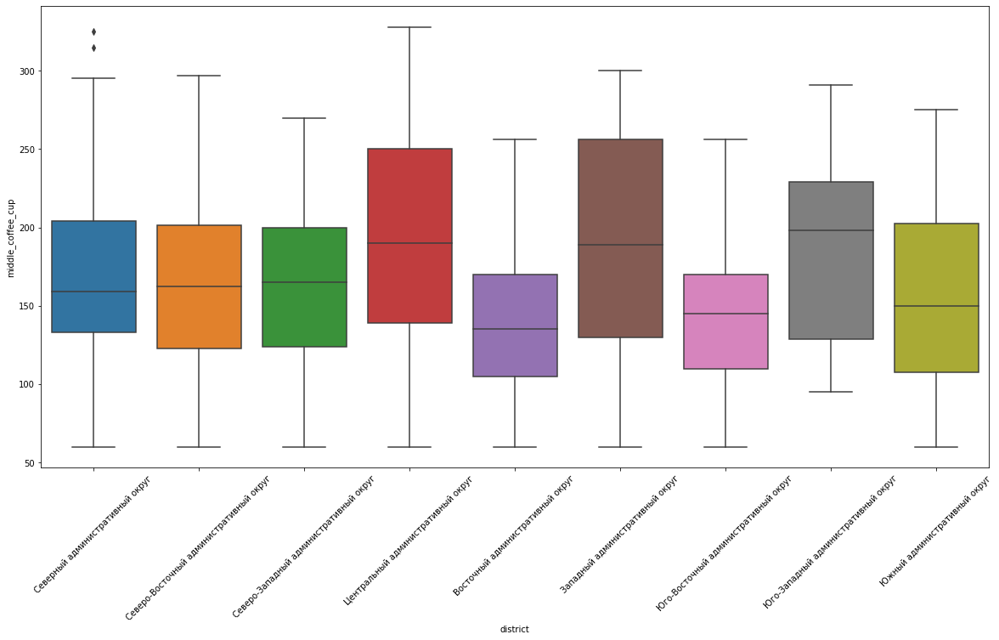

In [108]:
fig, ax = plt.subplots(figsize=(20, 10))
 
ax = sns.boxplot(x='district', y='middle_coffee_cup', data = cof_final)
ax = ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)

Видно, что самый дорогой кофе в Ценральном, Западном и Юго-Западном округах.

На основе проведенного анализа, я бы рекомендовала открытие кофейни в Центральном округе.
Несмотря на конкуренцию (уже открыто 428 кофеен), этот район остается самым проходным и популярным.
Тут сосредоточны туристические маршруты, места для прогулок и офисные центры.
Рекомендуемая цена чашки кофе 160 - 250 руб в зависимости от размера.

Ниже ссылка на презентацию

https://disk.yandex.ru/i/zd1YoB8Ct26Vtw

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Выводы понятны и логичны, а самое главное подкреплены выявленными фактами. Дана хорошая рекомендация.
</div>

<div class="alert alert-danger" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
✍ 
Но к сожалению не наблюдаю ссылку на презентацию, а это очень, если не самая главная часть нашего проекта.
</div>

<div style="border:solid blue 3px; padding: 20px">
<div class="alert alert-success">
<b>Обратная связь v.1</b> 
    
👋
Ирина, замечательная работа, ты мыслишь нестандартно, это отличный навык, который у тебя уже есть, ты последовательна и вдумчива. Твою работу очень интересно читать и проверять.  Я оставил несколько обязательных поправок для тебя и после этого буду готов сразу принять проект. 

Удачи в доработках, жду! 

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.2</b> 
    
👍 

    
**Презентация:**

Что нужно обязательно поправить:

- добавить ФИО (кем выполнен проект);
- добавить дату выполнения;
- добавить описание проекта;
- добавить контакты (телефон, email);
- добавить цели исследования;
- добавить рекомендации.

Сделано хорошо:

- есть общие выводы;
- на всех слайдах с графиками есть выводы


Что можно было бы сделать лучше:

- добавить нумерацию страниц;
- добавить оглавление.

Так же ты можешь пройти бесплатный курс от Яндекс.Практикума по презентациям — https://praktikum.yandex.ru/profile/visual-presentation/

</div>

<div style="border:solid blue 3px; padding: 20px">
<div class="alert alert-success">
<b>Обратная связь v.2</b> 
    
👋 
Ирина, спасибо, что прислала работу на повторное ревью. По проекту все замечания устранены и ты молодец! Осталась презентация. То, что нужно поправить я написал в комментарии выше. Жду твою работу :)

<div style="border:solid blue 3px; padding: 20px">
<div class="alert alert-success">
<b>Обратная связь v.3</b> 
    
👋 
Ирина, спасибо, что прислала работу на повторное ревью. К сожалению, изменений в презентации я не увидел. Без этого я не смогу принять проект. Прошу тебя внести обязательные праки.  Жду твою работу :)


    
Василий привет, видимо вчера вечером не сохранились изменения на платформе. Повторно высылаю ссылку на презентацию.
Спасибо за комментарии!
<div class="alert alert-info" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px "> 
<b>Комментарий студента</b> 
    
    
Василий привет, видимо вчера вечером не сохранились изменения на платформе. Повторно высылаю ссылку на презентацию.
Спасибо за комментарии!Добавила сортировку.  </div></div>

https://disk.yandex.ru/d/SafLhNt1WQuCeA

<div style="border:solid blue 3px; padding: 20px">
<div class="alert alert-success">
<b>Обратная связь v.3</b> 
    
👋 
      
Ирина, спасибо тебе за исправления критических моментов, а также спасибо за хорошую работу.
    
Поздравляю с успешным завершением проекта 😊👍
    
И желаю успехов в новых работах 😊